In [4]:
import matplotlib.pyplot as plt
plt.style.use('default')  # Reset to default style

In [5]:
import pandas as pd
import numpy as np
import os

# Define file paths
eigenval_path = '../data/bbj.maf.no_high_ld.prune.pca.eigenval'
sscore_path = '../data/cteph_agp3k.bbj.projection.sscore'

# Define Figure Output Directory
fig_dir = "/Users/tie_zhao/Desktop/tuning.pca/fig"
os.makedirs(fig_dir, exist_ok=True)
print(f"Figure directory set to: {fig_dir}")

# 1. Load Eigenvalues
eigenvalues = pd.read_csv(eigenval_path, header=None)

# 2. Load Score Data
# Assuming standard PLINK output format (tab-separated)
sscore_df = pd.read_csv(sscore_path, sep='\t')

# Compatibility: Rename #FID to FID if present
if '#FID' in sscore_df.columns:
    sscore_df.rename(columns={'#FID': 'FID'}, inplace=True)

# 3. Organize Samples
# Identify groups based on IID prefixes
# BBJ: starts with 'bbj_'
# Case: starts with 'PH'
# Control: everything else (Not BBJ and Not PH)
iid_series = sscore_df['IID'].astype(str)
is_bbj = iid_series.str.startswith('bbj_')
is_case = iid_series.str.startswith('PH')
is_ctrl = (~is_bbj) & (~is_case)

bbj_samples = sscore_df[is_bbj].copy()
case_samples = sscore_df[is_case].copy()
ctrl_samples = sscore_df[is_ctrl].copy()

# Assign SampleType labels for downstream use
bbj_samples['SampleType'] = 'BBJ'
case_samples['SampleType'] = 'Case'
ctrl_samples['SampleType'] = 'Control'

# Combine back
# Ordering Strategy for Visualization Layering (Bottom -> Top):
# 1. BBJ (Background)
# 2. Control
# 3. Case (Target of interest)
final_sscore = pd.concat([bbj_samples, ctrl_samples, case_samples], ignore_index=True)

print(f"=== Data Loading Summary ===")
print(f"Eigenvalues shape: {eigenvalues.shape}")
print(f"Total samples loaded: {len(final_sscore)}")
print(f"  - BBJ samples (Background): {len(bbj_samples)}")
print(f"  - Case samples (PH prefix): {len(case_samples)}")
print(f"  - Control samples (Other): {len(ctrl_samples)}")
print(f"Final dataset shape: {final_sscore.shape}")

Figure directory set to: /Users/tie_zhao/Desktop/tuning.pca/fig
=== Data Loading Summary ===
Eigenvalues shape: (10, 1)
Total samples loaded: 186485
  - BBJ samples (Background): 183013
  - Case samples (PH prefix): 380
  - Control samples (Other): 3092
Final dataset shape: (186485, 16)


>>> PREPARING DATA FOR GMM GRID SEARCH...
   -> Defining PC columns...
   -> Calculating Eigenvalue weights...
   -> BBJ Data Shape: (183013, 10)

>>> STARTING GMM GRID SEARCH
   -> PC Range: 2 to 10
   -> Cluster (k) Range: 2 to 15
   -> Models: 126
   ... Completed 120/126

>>> GRID SEARCH COMPLETE.

          BEST MODEL SELECTION (Min BIC)          
  • Optimal Components (k) : 14
  • Optimal PCs Used       : 10
  • Best BIC Score         : -21,044,095.10


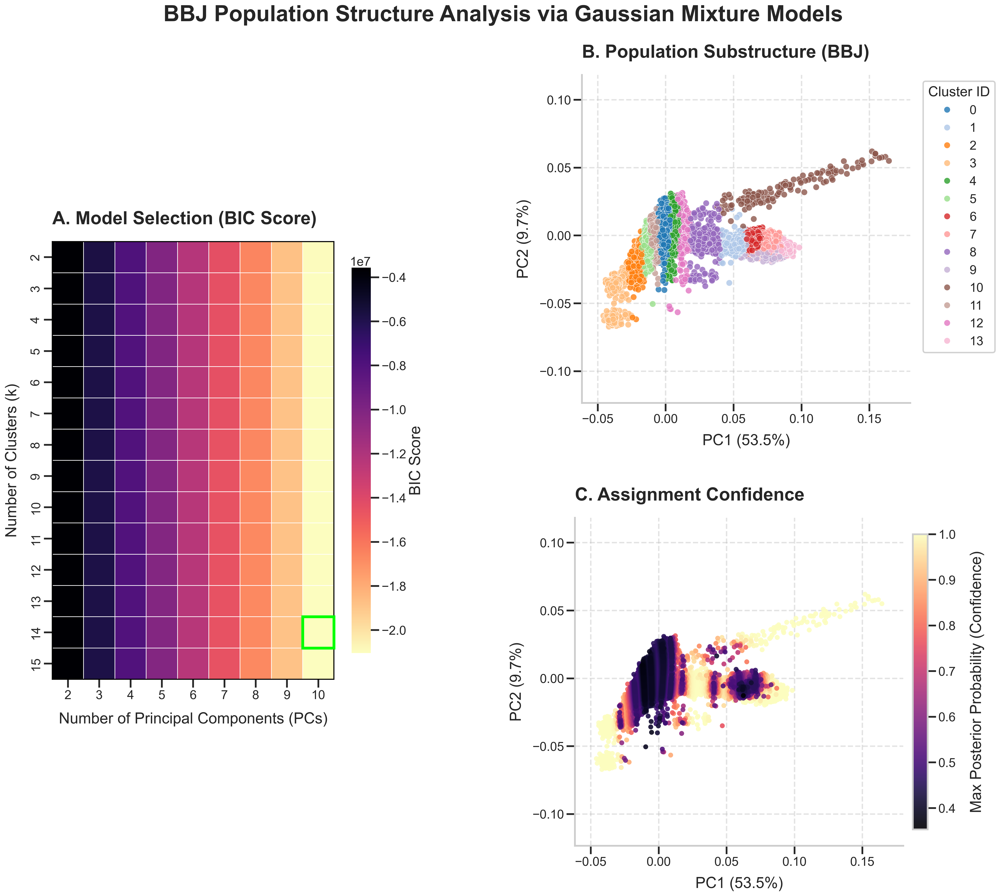

In [6]:
# === GMM Clustering with Weighted PCs (High-Impact Publication Quality) ===
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from concurrent.futures import ProcessPoolExecutor, as_completed
import importlib
import re # Needed for PC sorting
import gmm_utils
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gridspec

# Reload utils to ensure latest version is used
importlib.reload(gmm_utils)
from gmm_utils import evaluate_gmm

# --- Enhanced Publication Style Settings (Academic Standard) ---
plt.style.use('seaborn-v0_8-whitegrid') 
sns.set_context("poster", font_scale=1.1) 

# Force very large fonts specifically
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 20,          
    'axes.titlesize': 24,     
    'axes.labelsize': 22,    
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.title_fontsize': 20,
    'legend.fontsize': 18,
    'figure.titlesize': 28,
    'figure.dpi': 300,        # 300 DPI for Print Quality
    'axes.spines.top': False, 
    'axes.spines.right': False
})

# 1. Prepare Data
print(">>> PREPARING DATA FOR GMM GRID SEARCH...")

if 'pc_cols' not in locals():
    print("   -> Defining PC columns...")
    pc_cols = [col for col in final_sscore.columns if col.startswith('PC') and col.endswith('_AVG')]
    pc_cols.sort(key=lambda s: int(re.search(r'\d+', s).group()))

if 'eigen_vals_pct' not in locals():
    print("   -> Calculating Eigenvalue weights...")
    eigen_vals = eigenvalues.iloc[:, 0].values
    eigen_vals_pct = eigen_vals / eigen_vals.sum()

bbj_mask = final_sscore['SampleType'] == 'BBJ'
bbj_data_full = final_sscore[pc_cols].values[bbj_mask.values] 
print(f"   -> BBJ Data Shape: {bbj_data_full.shape}")

# 2. Grid Search Parameters
available_pcs = len(pc_cols)
gmm_pcs_range = range(2, available_pcs + 1) 
gmm_k_range = range(2, 16)   
param_grid_gmm = [(k, n_p) for k in gmm_k_range for n_p in gmm_pcs_range]

print(f"\n>>> STARTING GMM GRID SEARCH")
print(f"   -> PC Range: 2 to {available_pcs}")
print(f"   -> Cluster (k) Range: 2 to 15")
print(f"   -> Models: {len(param_grid_gmm)}")

gmm_results = []
if __name__ == "__main__":
    with ProcessPoolExecutor(max_workers=5) as executor:
        futures = {
            executor.submit(evaluate_gmm, k, n_p, bbj_data_full, eigen_vals_pct): (k, n_p)
            for k, n_p in param_grid_gmm
        }
        for i, future in enumerate(as_completed(futures)):
            k, n_p = futures[future]
            try:
                result = future.result()
                gmm_results.append(result)
            except Exception as e:
                print(f"Task failed (k={k}, pcs={n_p}): {e}")
            if (i + 1) % 10 == 0:
                print(f"   ... Completed {i + 1}/{len(param_grid_gmm)}", end='\r')

print("\n\n>>> GRID SEARCH COMPLETE.")
gmm_df = pd.DataFrame(gmm_results)
gmm_df = gmm_df[gmm_df['silhouette'] != -1.0]

if not gmm_df.empty:
    best_model_row = gmm_df.loc[gmm_df['bic'].idxmin()]
    best_k_gmm = int(best_model_row['n_components'])
    best_pcs_gmm = int(best_model_row['n_pcs'])
    best_bic = best_model_row['bic']

    print("\n" + "="*50)
    print(f"{'BEST MODEL SELECTION (Min BIC)':^50}")
    print("="*50)
    print(f"  • Optimal Components (k) : {best_k_gmm}")
    print(f"  • Optimal PCs Used       : {best_pcs_gmm}")
    print(f"  • Best BIC Score         : {best_bic:,.2f}")
    print("="*50)

    # 4. Final Model Fitting
    final_weights = eigen_vals_pct[:best_pcs_gmm]
    final_data_weighted_gmm = bbj_data_full[:, :best_pcs_gmm] * final_weights
    
    gmm_final = GaussianMixture(n_components=best_k_gmm, covariance_type='full', random_state=42, n_init=10, init_params='kmeans')
    bbj_labels = gmm_final.fit_predict(final_data_weighted_gmm)
    
    # Calculate Confidence
    probs = gmm_final.predict_proba(final_data_weighted_gmm)
    confidence_scores = np.max(probs, axis=1)

    # === Joint Visualization V11: Publication Ready Mosaic ===
    # Adjusted figsize for better proportions (A4-ish ratio but wider)
    fig = plt.figure(figsize=(24, 20), constrained_layout=False) 
    
    # Refined GridSpec:
    gs = gridspec.GridSpec(2, 2, width_ratios=[0.85, 1.15], height_ratios=[1, 1], wspace=0.25, hspace=0.35)

    # --- Plot A: BIC Heatmap (Left Column) ---
    ax1 = fig.add_subplot(gs[:, 0]) 
    
    pivot_bic = gmm_df.pivot(index='n_components', columns='n_pcs', values='bic')
    
    sns.heatmap(
        pivot_bic, 
        annot=False, 
        cmap='magma_r', 
        cbar_kws={'label': 'BIC Score', 'shrink': 0.5, 'pad': 0.05}, 
        ax=ax1,
        square=True,
        linewidths=0.5, linecolor='white'
    )
    
    best_pcs_idx = list(pivot_bic.columns).index(best_pcs_gmm)
    best_k_idx = list(pivot_bic.index).index(best_k_gmm)
    ax1.add_patch(Rectangle((best_pcs_idx, best_k_idx), 1, 1, 
                           fill=False, edgecolor='#00FF00', lw=4, clip_on=False, zorder=10))
    
    ax1.set_title(f'A. Model Selection (BIC Score)', loc='left', pad=25, fontweight='bold', fontsize=26)
    ax1.set_xlabel("Number of Principal Components (PCs)", labelpad=15)
    ax1.set_ylabel("Number of Clusters (k)", labelpad=15)
    
    # Box frame
    for _, spine in ax1.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')
    
    # Shared Data Setup
    pc1_orig = bbj_data_full[:, 0]
    pc2_orig = bbj_data_full[:, 1]
    x_min, x_max = pc1_orig.min(), pc1_orig.max()
    y_min, y_max = pc2_orig.min(), pc2_orig.max()
    max_span = max(x_max - x_min, y_max - y_min)
    view_span = max_span * 1.15 # Slightly more padding for labels
    x_center = (x_max + x_min) / 2
    y_center = (y_max + y_min) / 2
    
    # --- Plot B: Population Substructure (Right Top) ---
    ax2 = fig.add_subplot(gs[0, 1])
    
    palette_name = "tab20" if best_k_gmm > 10 else "tab10"
    palette = sns.color_palette(palette_name, n_colors=best_k_gmm)
    
    sns.scatterplot(
        x=pc1_orig,
        y=pc2_orig,
        hue=bbj_labels,
        palette=palette,
        alpha=0.8,      
        s=80,           
        edgecolor='w',  
        linewidth=0.5,
        legend='full',
        ax=ax2
    )
    
    ax2.set_title('B. Population Substructure (BBJ)', loc='left', pad=25, fontweight='bold', fontsize=26)
    ax2.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=12)
    ax2.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=12)
    ax2.set_xlim(x_center - view_span / 2, x_center + view_span / 2)
    ax2.set_ylim(y_center - view_span / 2, y_center + view_span / 2)
    ax2.set_aspect('equal')
    ax2.grid(True, linestyle='--', alpha=0.4, color='#bbbbbb')
    
    # Optimized Legend Positioning
    ax2.legend(title='Cluster ID', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, framealpha=0.9)

    # --- Plot C: Assignment Confidence (Right Bottom) ---
    ax3 = fig.add_subplot(gs[1, 1])
    
    # Sort Low -> High Confidence (Plot High Confidence at bottom, Holes at top?)
    # Wait, user wants to see High AND Low. 
    # High confidence = Majority of bulk. Low confidence = Edges.
    # If we print Low on Top of High, we see the edges clearly.
    # High confidence = 1.0. Low = 0.5.
    # Sort Ascending: Low first, High last (High covers Low). Bad for seeing edges.
    # Sort Descending: High first, Low last (Low covers High). Good for seeing edges.
    sort_idx = np.argsort(-confidence_scores) 
    
    pc1_sorted = pc1_orig[sort_idx]
    pc2_sorted = pc2_orig[sort_idx]
    conf_sorted = confidence_scores[sort_idx]
    
    sc = ax3.scatter(
        pc1_sorted,
        pc2_sorted,
        c=conf_sorted,
        cmap='magma', 
        alpha=0.9,      
        s=50,           
        edgecolor='none'
    )
    
    # Updated Title (Removed parenthesis content)
    ax3.set_title('C. Assignment Confidence', loc='left', pad=25, fontweight='bold', fontsize=26)
    ax3.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=12)
    ax3.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=12)
    ax3.set_xlim(x_center - view_span / 2, x_center + view_span / 2)
    ax3.set_ylim(y_center - view_span / 2, y_center + view_span / 2)
    ax3.set_aspect('equal')
    ax3.grid(True, linestyle='--', alpha=0.4, color='#bbbbbb')
    
    # Updated Colorbar (New Title, No Rotation)
    cbar = fig.colorbar(sc, ax=ax3, shrink=0.9, pad=0.02)
    cbar.set_label('Max Posterior Probability (Confidence)', labelpad=20) # Removed rotation arg
    
    plt.suptitle("BBJ Population Structure Analysis via Gaussian Mixture Models", 
                fontsize=32, fontweight='bold', y=0.95, ha='center')
    
    import os
    plt.savefig(os.path.join(fig_dir, '01.gmm_model_selection.png'), bbox_inches='tight', dpi=300)

    plt.show()

else:
    print("Grid search returned no valid results.")

In [7]:
# === Post-hoc Cluster Merging & Analysis (Publication Quality 3x2 Layout) v4 ===
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.patheffects as pe # For text outlines
import numpy as np
import logging
import sys
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors

# --- 1. Setup & Styling (Academic Standard - Maximized Fonts) ---
plt.style.use('seaborn-v0_8-whitegrid') 
sns.set_context("paper", font_scale=2.0) # Highly increased font scale

plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 20,          
    'axes.titlesize': 26,     
    'axes.labelsize': 22,    
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.title_fontsize': 20,
    'legend.fontsize': 18,
    'figure.titlesize': 34,
    'figure.dpi': 300, 
    'axes.spines.top': False, 
    'axes.spines.right': False,
    'axes.linewidth': 1.5,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
})

# Setup Logger
logger = logging.getLogger("ClusterMerge")
logger.setLevel(logging.INFO)
if logger.hasHandlers():
    logger.handlers.clear()
handler = logging.StreamHandler(sys.stdout)
handler.setFormatter(logging.Formatter('%(message)s'))
logger.addHandler(handler)

print(">>> STARTING POST-HOC CLUSTER MERGING ANALYSIS...")

# --- 2. Calculations ---
# Robustness Check
if 'bbj_labels' not in globals():
    raise NameError("Critical Error: 'bbj_labels' not found. Please RUN the previous 'Grid Search' cell first to define it.")

# A. Centroids
unique_labels = np.unique(bbj_labels)
n_clusters_current = len(unique_labels)
centroids_weighted = np.zeros((n_clusters_current, final_data_weighted_gmm.shape[1]))
centroids_pca = np.zeros((n_clusters_current, 2)) 

for i, label in enumerate(unique_labels):
    mask = bbj_labels == label
    centroids_weighted[i] = final_data_weighted_gmm[mask].mean(axis=0)
    centroids_pca[i] = [pc1_orig[mask].mean(), pc2_orig[mask].mean()]

# B. Distance Matrix 
dists = pdist(centroids_weighted, metric='euclidean')
dist_matrix = squareform(dists)

print(f"   -> Computed Centroids & Distance Matrix for {n_clusters_current} initial clusters")

# C. Hierarchical Clustering
if n_clusters_current > 1:
    Z = linkage(dists, method='single')
    merge_threshold = 0.009 
    
    adjacency = dist_matrix < merge_threshold
    n_merged, new_label_map = connected_components(csr_matrix(adjacency), directed=False)
else:
    Z = None
    merge_threshold = 0.0
    n_merged = 1
    new_label_map = np.array([0])

bbj_labels_merged = new_label_map[bbj_labels]
unique_m, counts_m = np.unique(bbj_labels_merged, return_counts=True)

# E. Calculate Merged Confidence
# Sum probabilities of all original clusters that map to the new merged ID
probs_original = gmm_final.predict_proba(final_data_weighted_gmm)
n_merged_clusters = len(np.unique(new_label_map))
probs_merged = np.zeros((probs_original.shape[0], n_merged_clusters))

for old_k, new_k in enumerate(new_label_map):
    probs_merged[:, new_k] += probs_original[:, old_k]

confidence_merged = np.max(probs_merged, axis=1) # Max probability among new clusters

print("\n" + "="*50)
print(f"{'MERGING RESULTS':^50}")
print("="*50)
print(f"  • Threshold Applied      : {merge_threshold:.4f}")
print(f"  • Original Clusters      : {n_clusters_current}")
print(f"  • Post-Merge Clusters    : {n_merged}")
print("-" * 50)
print(f"  • Merge Mapping Table:")
for old in range(n_clusters_current):
    print(f"    - Original {old} -> New {new_label_map[old]}")
print("="*50)

# --- 3. Composite Visualization (3 Rows x 2 Cols) ---
fig = plt.figure(figsize=(24, 36)) # Slightly wider/taller for big fonts
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 1], wspace=0.3, hspace=0.4)

# Helper for Isometric View
def apply_isometric_view(ax, x_data, y_data):
    if len(x_data) == 0: return
    x_min, x_max = x_data.min(), x_data.max()
    y_min, y_max = y_data.min(), y_data.max()
    max_span = max(x_max - x_min, y_max - y_min)
    if max_span == 0: max_span = 1.0 
    view_span = max_span * 1.20 # 20% margin
    x_center = (x_max + x_min) / 2
    y_center = (y_max + y_min) / 2
    ax.set_xlim(x_center - view_span / 2, x_center + view_span / 2)
    ax.set_ylim(y_center - view_span / 2, y_center + view_span / 2)
    ax.set_aspect('equal')
    ax.grid(True, linestyle='--', alpha=0.4, color='#cccccc', linewidth=1.0)

# --- Define Palette Globally (for Consistency between C and D) ---
palette_merged = sns.color_palette("tab10" if n_merged <= 10 else "tab20", n_colors=n_merged)
palette_hex = [mcolors.to_hex(c) for c in palette_merged]

# --- Prepare Dendrogram Coloring (Plot C) ---
link_color_func = None
if Z is not None:
    # 1. Map leaf nodes (original clusters) to their merged label
    # Leaf node index i corresponds to original cluster i
    node_labels = {i: new_label_map[i] for i in range(n_clusters_current)}
    
    # 2. Traverse Z to map internal nodes (merged links)
    # Z has rows 0 to n-2. Row i corresponds to internal node n + i
    for i, row in enumerate(Z):
        node_idx = i + n_clusters_current
        child1, child2 = int(row[0]), int(row[1])
        dist = row[2]
        
        # If the link distance is <= threshold, it's part of a merged cluster.
        # Its label is inherited from children (which must match).
        if dist <= merge_threshold:
            lid1 = node_labels.get(child1, -1)
            # Assign label if valid. If children conflict or are -1, this logic handles simplistic case.
            # Since we defined groups by connected components on dist < threshold, 
            # all nodes in a subtree below threshold MUST belong to same component.
            node_labels[node_idx] = lid1
        else:
            # Merging different components -> No specific color (grey)
            node_labels[node_idx] = -1

    # 3. Define the coloring function
    def link_color_func(k):
        lid = node_labels.get(k, -1)
        if lid != -1:
            return palette_hex[lid]
        else:
            return '#444444' # Grey for links above threshold

# --- Panel A: Original Clusters (0,0) ---
ax1 = fig.add_subplot(gs[0, 0])
palette_orig = sns.color_palette("tab20", n_colors=n_clusters_current)
sns.scatterplot(x=pc1_orig, y=pc2_orig, hue=bbj_labels, palette=palette_orig, 
                alpha=0.5, s=60, edgecolor='w', linewidth=0.2, legend=False, ax=ax1)

# High-contrast centroids - Reduced size as requested
for i, (cx, cy) in enumerate(centroids_pca):
    ax1.scatter(cx, cy, s=300, color='white', edgecolor='#333333', linewidth=2.5, zorder=10)
    ax1.text(cx, cy, str(i), fontsize=18, fontweight='bold', ha='center', va='center', color='black', zorder=11)

ax1.set_title("A. Initial Clusters & Centroids", loc='left', pad=25, fontweight='bold')
ax1.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=15)
ax1.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=15)
apply_isometric_view(ax1, pc1_orig, pc2_orig)

# --- Panel B: Distance Matrix (0,1) ---
ax2 = fig.add_subplot(gs[0, 1])
if n_clusters_current > 1:
    hm = sns.heatmap(dist_matrix, annot=False, cmap="YlGnBu", square=True,
                linewidths=1.5, linecolor='white',
                xticklabels=unique_labels, yticklabels=unique_labels, 
                cbar_kws={'shrink': 0.7, 'pad': 0.05}, ax=ax2)
    
    # Customizing Heatmap Colorbar Label size
    cbar_b = hm.collections[0].colorbar
    cbar_b.set_label('Euclidean Distance', size=20, labelpad=15)
    cbar_b.ax.tick_params(labelsize=16)

    ax2.set_title("B. Pairwise Distance Matrix", loc='left', pad=25, fontweight='bold')
else:
    ax2.text(0.5, 0.5, "N/A (K=1)", ha='center', va='center', fontsize=24)
    ax2.axis('off')

ax2.tick_params(axis='both', labelsize=18, length=5)
for _, spine in ax2.spines.items(): 
    spine.set_visible(True)
    spine.set_linewidth(2.0)
    spine.set_color('#444444')

# --- Panel C: Dendrogram (1,0) ---
ax3 = fig.add_subplot(gs[1, 0])
if Z is not None:
    with plt.rc_context({'lines.linewidth': 3.0}):
        dendrogram(Z, ax=ax3, labels=unique_labels, 
                   color_threshold=merge_threshold, 
                   link_color_func=link_color_func, # Use our custom color function
                   leaf_font_size=18, above_threshold_color='#444444')
    ax3.axhline(y=merge_threshold, c='#E31A1C', ls='--', lw=3.0, label=f'Threshold={merge_threshold}')
    ax3.legend(loc='upper right', fontsize=18, frameon=True, framealpha=0.9, edgecolor='#cccccc')
else:
    ax3.text(0.5, 0.5, "N/A (K=1)", ha='center', va='center', fontsize=24)
ax3.set_title("C. Hierarchical Clustering", loc='left', pad=25, fontweight='bold')
ax3.grid(False)
sns.despine(ax=ax3, offset=10, trim=False)
ax3.set_ylabel("Genetic Distance", labelpad=15)

# --- Panel D: Merged Clusters (1,1) ---
ax4 = fig.add_subplot(gs[1, 1])
# Uses the pre-defined palette_merged for consistency with C
sns.scatterplot(x=pc1_orig, y=pc2_orig, hue=bbj_labels_merged, palette=palette_merged,
                alpha=0.7, s=80, edgecolor='w', linewidth=0.5, legend='full', ax=ax4)

# Outlined labels for merged clusters
for merged_label in unique_m:
    mask = bbj_labels_merged == merged_label
    if np.any(mask):
        cx = pc1_orig[mask].mean()
        cy = pc2_orig[mask].mean()
        txt = ax4.text(cx, cy, f"{merged_label}", fontsize=32, fontweight='bold', 
                 color='black', ha='center', va='center', zorder=12)
        txt.set_path_effects([pe.withStroke(linewidth=5, foreground='white', alpha=0.9)])

ax4.set_title(f"D. Final Merged Structure", loc='left', pad=25, fontweight='bold')
ax4.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=15)
ax4.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=15)
ax4.legend(title='Merged ID', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, framealpha=0.95, edgecolor='#cccccc')
apply_isometric_view(ax4, pc1_orig, pc2_orig)

# --- Panel E: Merged Confidence (2,0) ---
ax5 = fig.add_subplot(gs[2, 0])

# Draw low confidence on TOP (to see boundaries)
# argsort sorts Low->High. Scatter draws first->last (Bottom->Top).
# So argsort()[::-1] gives High->Low. Scatter draws High (Bottom) -> Low (Top).
sort_idx = np.argsort(confidence_merged)[::-1]
pc1_s = pc1_orig[sort_idx]
pc2_s = pc2_orig[sort_idx]
conf_s = confidence_merged[sort_idx]

sc = ax5.scatter(
    pc1_s, pc2_s, c=conf_s,
    cmap='magma', alpha=0.9, s=50, edgecolor='none', rasterized=True 
)

ax5.set_title("E. Merged Assignment Confidence", loc='left', pad=25, fontweight='bold')
ax5.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=15)
ax5.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=15)
apply_isometric_view(ax5, pc1_orig, pc2_orig)

# Colorbar with Side Title
cbar = fig.colorbar(sc, ax=ax5, shrink=0.7, pad=0.04)
cbar.ax.tick_params(labelsize=18)
cbar.set_label('Confidence (Merged)', labelpad=20, size=20)

# --- Panel F: Placeholder (2,1) ---
ax6 = fig.add_subplot(gs[2, 1])
ax6.axis('off')

# Main Title
plt.suptitle(f"Post-hoc Cluster Merging Analysis (Threshold={merge_threshold})", 
             fontsize=40, fontweight='bold', y=0.96, ha='center')

import os
plt.savefig(os.path.join(fig_dir, '02.gmm_cluster_merging.png'), bbox_inches='tight', dpi=300)

plt.show()

>>> STARTING POST-HOC CLUSTER MERGING ANALYSIS...
   -> Computed Centroids & Distance Matrix for 14 initial clusters

                 MERGING RESULTS                  
  • Threshold Applied      : 0.0090
  • Original Clusters      : 14
  • Post-Merge Clusters    : 5
--------------------------------------------------
  • Merge Mapping Table:
    - Original 0 -> New 0
    - Original 1 -> New 1
    - Original 2 -> New 0
    - Original 3 -> New 2
    - Original 4 -> New 0
    - Original 5 -> New 0
    - Original 6 -> New 1
    - Original 7 -> New 1
    - Original 8 -> New 3
    - Original 9 -> New 1
    - Original 10 -> New 4
    - Original 11 -> New 0
    - Original 12 -> New 0
    - Original 13 -> New 1


In [8]:
# === Save Results & Models ===
import os
import joblib

# 0. Define and Create Output Directory
# Naming convention: 00. + Descriptive Name
output_base = "/Users/tie_zhao/Desktop/tuning.pca/results"
output_folder = "00.gmm_clustering_results"
output_dir = os.path.join(output_base, output_folder)

os.makedirs(output_dir, exist_ok=True)
print(f">>> SAVING OUTPUTS TO: {output_dir}")

# 1. Save Best GMM Model
# Useful for predicting new samples later or reproducing results
model_filename = "best_gmm_model.joblib"
model_path = os.path.join(output_dir, model_filename)
joblib.dump(gmm_final, model_path)
print(f"   [1/3] Model saved: {model_filename}")

# 2. Save Weighted SScore Matrix (Training Data)
# Retrieve FID/IID for the BBJ samples used in training
# Note: bbj_mask aligns with final_sscore rows
# Handle potential #FID from PLINK output
fid_col = '#FID' if '#FID' in final_sscore.columns else 'FID'
bbj_meta = final_sscore.loc[bbj_mask, [fid_col, 'IID']].reset_index(drop=True)
if fid_col == '#FID':
    bbj_meta = bbj_meta.rename(columns={'#FID': 'FID'})

# Create DataFrame with Weighted PCs
# Naming columns PC1_w, PC2_w... to distinguish from raw PCs
weighted_cols = [f"PC{i+1}_weighted" for i in range(final_data_weighted_gmm.shape[1])]
df_weighted = pd.DataFrame(final_data_weighted_gmm, columns=weighted_cols)

# Combine Metadata + Data
df_training_export = pd.concat([bbj_meta, df_weighted], axis=1)

training_file = "bbj_gmm_training_weighted_matrix.tsv"
training_path = os.path.join(output_dir, training_file)
df_training_export.to_csv(training_path, sep='\t', index=False)
print(f"   [2/3] Weighted matrix saved: {training_file} (Rows: {len(df_training_export)})")

# 3. Save Assignment Results
# Columns: FID, IID, Original_Cluster, Merged_Cluster
df_results = bbj_meta.copy()
df_results['Original_Cluster'] = bbj_labels
# Ensure merged assignments are available (from the merge cell)
if 'bbj_labels_merged' in locals():
    df_results['Merged_Cluster'] = bbj_labels_merged
else:
    print("   ! Warning: Merged labels not found. Saving only original clusters.")
    df_results['Merged_Cluster'] = np.nan

results_file = "bbj_cluster_assignments.tsv"
results_path = os.path.join(output_dir, results_file)
df_results.to_csv(results_path, sep='\t', index=False)
print(f"   [3/3] Cluster assignments saved: {results_file}")

print(">>> ALL SAVE OPERATIONS COMPLETE.")

>>> SAVING OUTPUTS TO: /Users/tie_zhao/Desktop/tuning.pca/results/00.gmm_clustering_results
   [1/3] Model saved: best_gmm_model.joblib
   [2/3] Weighted matrix saved: bbj_gmm_training_weighted_matrix.tsv (Rows: 183013)
   [3/3] Cluster assignments saved: bbj_cluster_assignments.tsv
>>> ALL SAVE OPERATIONS COMPLETE.


>>> CALCULATING POSTERIOR PROBABILITIES FOR CASE/CONTROL SAMPLES...
   -> Results will be saved to: /Users/tie_zhao/Desktop/tuning.pca/results/01.case_control_assignment
   -> Aggregating probabilities to 5 merged clusters...
   -> Saved assignment file: case_control_posterior_probabilities.tsv


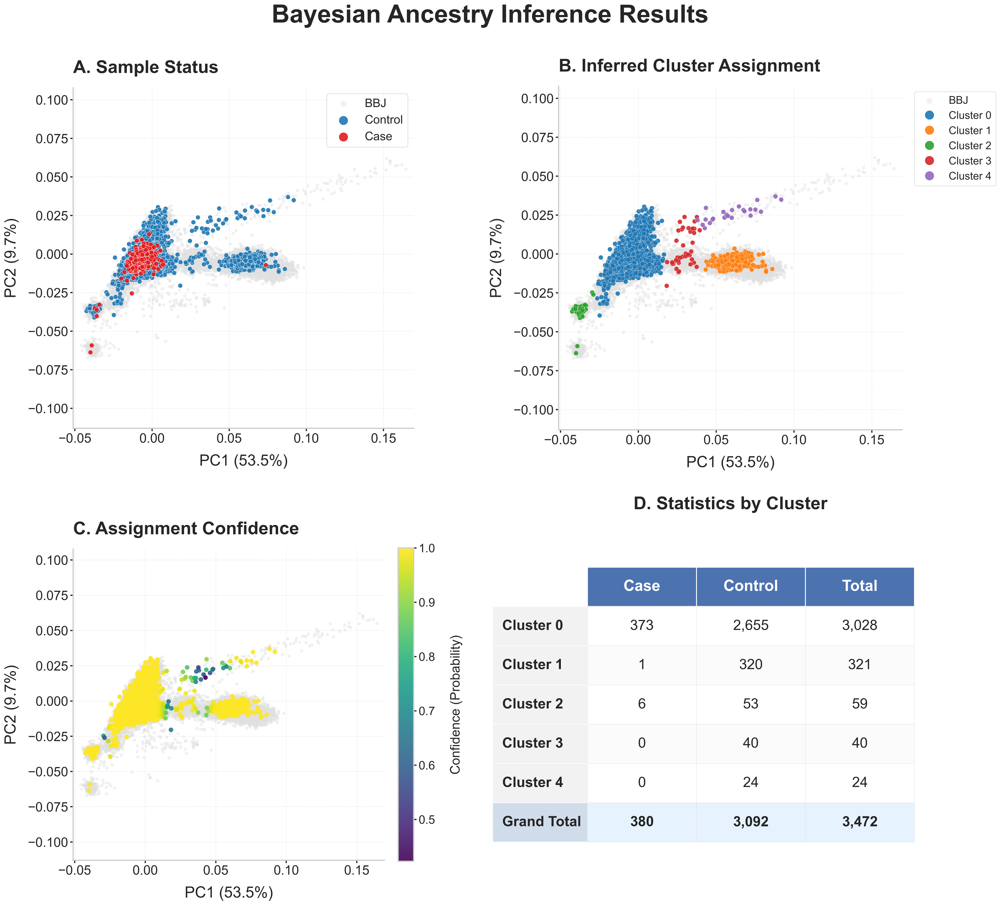

In [9]:
# === Case/Control Posterior Probability Analysis & Visualization (2x2 Composite) - Publication Quality ===
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import matplotlib.gridspec as gridspec

# --- 1. Global Style Settings (Maximized Fonts) ---
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("paper", font_scale=2.5) # Increased scale

plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 22,
    'axes.titlesize': 30,
    'axes.labelsize': 26,
    'xtick.labelsize': 22,
    'ytick.labelsize': 22,
    'legend.title_fontsize': 24,
    'legend.fontsize': 22,
    'figure.titlesize': 40,
    'figure.dpi': 300,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.linewidth': 2.0,
    'xtick.major.width': 2.0,
    'ytick.major.width': 2.0,
})

print(">>> CALCULATING POSTERIOR PROBABILITIES FOR CASE/CONTROL SAMPLES...")

# 1. Define Output Directory 
# Structure: results/01.<name>
folder_name = "01.case_control_assignment"
output_dir_val = os.path.join(output_base, folder_name)
os.makedirs(output_dir_val, exist_ok=True)
print(f"   -> Results will be saved to: {output_dir_val}")

# 2. Select Case and Control Samples
validation_mask = final_sscore['SampleType'].isin(['Case', 'Control'])
validation_data_full = final_sscore.loc[validation_mask, pc_cols].values 

# Retrieve Metadata
fid_col_val = '#FID' if '#FID' in final_sscore.columns else 'FID'
validation_meta = final_sscore.loc[validation_mask, [fid_col_val, 'IID', 'SampleType']].reset_index(drop=True)
if fid_col_val == '#FID':
    validation_meta.rename(columns={'#FID': 'FID'}, inplace=True)

# 3. Apply Weights (Using GMM training weights)
validation_data_weighted = validation_data_full[:, :best_pcs_gmm] * final_weights

# 4. Bayesian Inference (Posterior Probabilities)
# P(Original_Cluster | Data)
probs_original = gmm_final.predict_proba(validation_data_weighted)

# 5. Aggregate to Merged Clusters
unique_merged_labels = np.unique(bbj_labels_merged)
n_merged_clusters = len(unique_merged_labels)
probs_merged = np.zeros((len(validation_meta), n_merged_clusters))

print(f"   -> Aggregating probabilities to {n_merged_clusters} merged clusters...")
for original_k, merged_m in enumerate(new_label_map):
    probs_merged[:, merged_m] += probs_original[:, original_k]

# 6. Construct Results DataFrame
cols_prob = [f"Prob_Merge_Cluster_{m}" for m in range(n_merged_clusters)]
df_probs = pd.DataFrame(probs_merged, columns=cols_prob)

# Hard Assignment & Confidence
final_assignments_idx = np.argmax(probs_merged, axis=1)
final_labels = unique_merged_labels[final_assignments_idx]

df_validation_results = pd.concat([validation_meta, df_probs], axis=1)
df_validation_results['Assigned_Merged_Cluster'] = final_labels
df_validation_results['Assignment_Confidence'] = df_probs.max(axis=1)

# Add PC coordinates for plotting
df_validation_results['PC1'] = validation_data_full[:, 0]
df_validation_results['PC2'] = validation_data_full[:, 1]

# Save TSV
output_file_validation = "case_control_posterior_probabilities.tsv"
output_path_validation = os.path.join(output_dir_val, output_file_validation)
df_validation_results.to_csv(output_path_validation, sep='\t', index=False)
print(f"   -> Saved assignment file: {output_file_validation}")

# --- 7. Composite Visualization (2x2 Subplots) ---
# Layering Strategy: Bottom=BBJ(Bg), Middle=Control, Top=Case
# We sort the validation dataframe so Control comes before Case, 
# ensuring Case is drawn on top by plot functions that iterate rows.
df_validation_results['Layer_Order'] = df_validation_results['SampleType'].map({'Control': 1, 'Case': 2})
df_validation_results = df_validation_results.sort_values('Layer_Order')

# Prepare Background Data (BBJ)
bbj_pc1 = final_sscore.loc[final_sscore['SampleType'] == 'BBJ', pc_cols[0]]
bbj_pc2 = final_sscore.loc[final_sscore['SampleType'] == 'BBJ', pc_cols[1]]

# Setup Figure
fig = plt.figure(figsize=(26, 24)) # Large canvas for big fonts
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1.2], wspace=0.3, hspace=0.3)

# Helper for Isometric View & Background
def setup_plot_base(ax, title):
    # 1. Background (BBJ) - Lowest Layer
    ax.scatter(bbj_pc1, bbj_pc2, c='#E0E0E0', s=20, alpha=0.4, label='BBJ', rasterized=True, zorder=0)
    
    # 2. Isometric Limits (re-calculate based on full data range)
    # Combine all PC1/PC2 to find global bounds
    all_x = np.concatenate([bbj_pc1, df_validation_results['PC1']])
    all_y = np.concatenate([bbj_pc2, df_validation_results['PC2']])
    
    x_min, x_max = all_x.min(), all_x.max()
    y_min, y_max = all_y.min(), all_y.max()
    max_span = max(x_max - x_min, y_max - y_min) * 1.05
    x_center = (x_max + x_min) / 2
    y_center = (y_max + y_min) / 2
    
    ax.set_xlim(x_center - max_span/2, x_center + max_span/2)
    ax.set_ylim(y_center - max_span/2, y_center + max_span/2)
    ax.set_aspect('equal')
    
    ax.set_title(title, loc='left', pad=25, fontweight='bold')
    ax.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=15)
    ax.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=15)
    ax.grid(True, linestyle='--', alpha=0.3, color='#bbbbbb')

# --- Plot A: Case vs Control ---
ax1 = fig.add_subplot(gs[0, 0])
setup_plot_base(ax1, "A. Sample Status")

for stype, color, marker in [('Control', '#1F78B4', 'o'), ('Case', '#E31A1C', '^')]:
    subset = df_validation_results[df_validation_results['SampleType'] == stype]
    ax1.scatter(subset['PC1'], subset['PC2'], c=color, label=stype, 
                s=60, alpha=0.9, edgecolors='white', linewidth=0.5, zorder=2 if stype=='Control' else 3)

# Legend inside plain text or box
ax1.legend(loc='upper right', frameon=True, framealpha=0.9, fontsize=20, markerscale=2.0)

# --- Plot B: Assigned Cluster ---
ax2 = fig.add_subplot(gs[0, 1])
setup_plot_base(ax2, "B. Inferred Cluster Assignment")

# Reuse global palette for consistency (if defined earlier in merged cell, else redefine)
if 'palette_merged' not in globals():
     palette_merged = sns.color_palette("tab10" if n_merged_clusters <= 10 else "tab20", n_colors=n_merged_clusters)

sns.scatterplot(data=df_validation_results, x='PC1', y='PC2', hue='Assigned_Merged_Cluster', 
                palette=palette_merged, s=60, alpha=0.9, edgecolor='white', linewidth=0.3, ax=ax2, zorder=2)

# Custom Legend
h, l = ax2.get_legend_handles_labels()
new_labels = []
for txt in l:
    if "BBJ" in txt: # More robust check
        new_labels.append("BBJ")
    else:
        new_labels.append(f"Cluster {txt}")
ax2.legend(h, new_labels, title=None, bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, fontsize=18, markerscale=2.0)

# --- Plot C: Assignment Confidence ---
ax3 = fig.add_subplot(gs[1, 0])
setup_plot_base(ax3, "C. Assignment Confidence")

# Sort so Low confidence is on top (High->Low)
sort_idx = np.argsort(df_validation_results['Assignment_Confidence'].values)[::-1]
df_sorted = df_validation_results.iloc[sort_idx]

sc = ax3.scatter(df_sorted['PC1'], df_sorted['PC2'], 
                 c=df_sorted['Assignment_Confidence'], cmap='viridis', 
                 s=60, alpha=0.9, edgecolors='none', zorder=2)

cbar = plt.colorbar(sc, ax=ax3, fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Confidence (Probability)', labelpad=25, size=22)

# --- Plot D: Assignment Statistics Table (Enhanced Layout) ---
ax4 = fig.add_subplot(gs[1, 1])
ax4.axis('off')
ax4.set_title("D. Statistics by Cluster", loc='center', pad=40, fontweight='bold')

# 1. Prepare Data
summary_table = df_validation_results.groupby(['Assigned_Merged_Cluster', 'SampleType']).size().unstack(fill_value=0)
for col in ['Case', 'Control']:
    if col not in summary_table.columns:
        summary_table[col] = 0
summary_table = summary_table[['Case', 'Control']]
summary_table['Total'] = summary_table['Case'] + summary_table['Control']

# 2. Build Text Content
columns = ['Case', 'Control', 'Total']
row_labels = [f"Cluster {idx}" for idx in summary_table.index]
cell_text = []

for idx, row in summary_table.iterrows():
    cell_text.append([
        f"{int(row['Case']):,}", 
        f"{int(row['Control']):,}", 
        f"{int(row['Total']):,}"
    ])

# Grand Total Row
totals = summary_table[['Case', 'Control', 'Total']].sum()
cell_text.append([f"{int(totals['Case']):,}", f"{int(totals['Control']):,}", f"{int(totals['Total']):,}"])
row_labels.append("Grand Total")

# 3. Create Table
# Use a centered location.
the_table = ax4.table(
    cellText=cell_text,
    rowLabels=row_labels,
    colLabels=columns,
    loc='center',
    cellLoc='center',
    bbox=[0.15, 0.1, 0.8, 0.8] # Shifted Right: Left 0.1 -> 0.15
)

# 4. Styling (Table Fonts Maximized)
the_table.auto_set_font_size(False)
the_table.set_fontsize(24) # Significant increase

# Apply specific cell styling
cells = the_table.get_celld()
n_rows_table = len(cell_text) + 1 # +1 for header

# Calculate height dynamically
row_height = 0.9 / n_rows_table

for (row, col), cell in cells.items():
    cell.set_height(row_height)
    
    # Header Row (row 0)
    if row == 0:
        cell.set_text_props(weight='bold', color='white', size=26)
        cell.set_facecolor('#4C72B0') 
        cell.set_linewidth(1.5)
        cell.set_edgecolor('white')
    
    # Row Headers (col -1) - The clusters
    elif col == -1:
        cell.set_text_props(weight='bold', size=24)
        cell.set_facecolor('#f2f2f2') 
        cell.set_linewidth(1)
        cell.set_edgecolor('white')
        if row == len(cell_text): # Grand Total
            cell.set_facecolor('#d1dceb') 
            
    # Data Cells
    else:
        cell.set_text_props(size=24)
        cell.set_linewidth(0.5)
        cell.set_edgecolor('#dddddd')
        
        # Grand Total Data Row
        if row == len(cell_text):
            cell.set_facecolor('#e6f3ff')
            cell.set_text_props(weight='bold')
        # Zebra Striping
        elif row % 2 == 0:
            cell.set_facecolor('#fbfbfb')
        else:
            cell.set_facecolor('white')

# Main Title
plt.suptitle(f"Bayesian Ancestry Inference Results", 
             fontsize=42, fontweight='bold', y=0.96)

import os
plt.savefig(os.path.join(fig_dir, '03.case_control_assignment.png'), bbox_inches='tight', dpi=300)

plt.show()

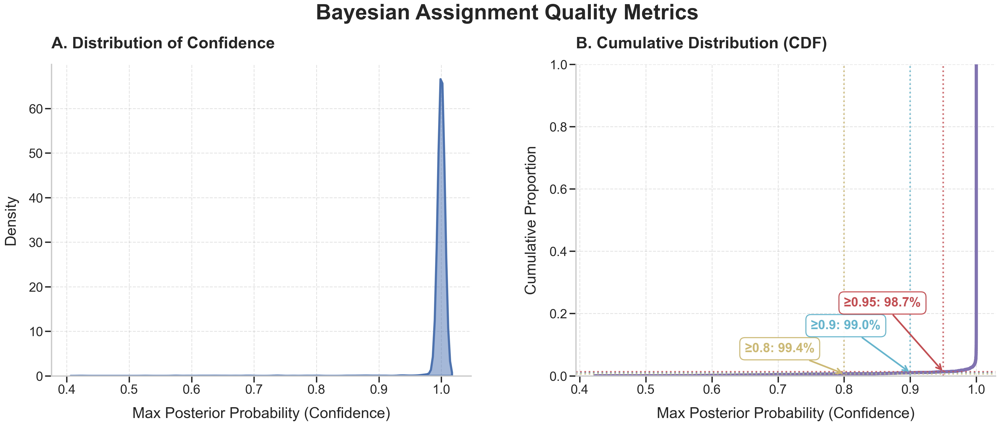

          CONFIDENCE STATISTICS SUMMARY           
count    3472.000000
mean        0.996846
std         0.028830
min         0.422985
25%         0.999990
50%         0.999996
75%         0.999997
max         1.000000
--------------------------------------------------
High Confidence Sample Counts:
  • >= 0.80 :  3451 samples (99.4%)
  • >= 0.90 :  3437 samples (99.0%)
  • >= 0.95 :  3427 samples (98.7%)
  • >= 0.99 :  3391 samples (97.7%)


In [10]:
# === Analysis of Assignment Confidence Distribution ===
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Consistent Publication Style Settings (Enhanced for Clarity) ---
plt.style.use('seaborn-v0_8-whitegrid') 
sns.set_context("poster", font_scale=1.4)  # Increased font scale for maximum readability

# Force very large fonts and clean academic look
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 24,          
    'axes.titlesize': 30,     
    'axes.labelsize': 28,    
    'xtick.labelsize': 24,
    'ytick.labelsize': 24,
    'legend.title_fontsize': 26,
    'legend.fontsize': 24,
    'figure.titlesize': 38,
    'figure.dpi': 150, 
    'axes.spines.top': False, 
    'axes.spines.right': False
})

# Ensure we have the data
if 'df_validation_results' in locals():
    confidence_scores = df_validation_results['Assignment_Confidence']
    
    # Setup Figure (Slightly larger to accommodate bold fonts)
    fig, axes = plt.subplots(1, 2, figsize=(28, 12)) 
    plt.subplots_adjust(wspace=0.25, left=0.08, right=0.95, top=0.82, bottom=0.15)
    
    # --- Plot A: Kernel Density Estimate (KDE) ---
    ax1 = axes[0]
    # Thicker line for professional visibility
    sns.kdeplot(confidence_scores, color='#4C72B0', fill=True, alpha=0.5, linewidth=4, ax=ax1) 
    
    ax1.set_title("A. Distribution of Confidence", loc='left', pad=30, fontweight='bold')
    ax1.set_xlabel("Max Posterior Probability (Confidence)", labelpad=20)
    ax1.set_ylabel("Density", labelpad=20)
    ax1.grid(True, linestyle='--', alpha=0.4, color='#bbbbbb', linewidth=1.5) 

    # --- Plot B: Cumulative Distribution Function (CDF) ---
    ax2 = axes[1]
    sns.ecdfplot(data=confidence_scores, color='#8172B2', linewidth=6, ax=ax2) 
    
    ax2.set_title("B. Cumulative Distribution (CDF)", loc='left', pad=30, fontweight='bold')
    ax2.set_xlabel("Max Posterior Probability (Confidence)", labelpad=20)
    ax2.set_ylabel("Cumulative Proportion", labelpad=20)
    ax2.grid(True, linestyle='--', alpha=0.4, color='#bbbbbb', linewidth=1.5)
    
    # Mark specific thresholds (e.g. 0.8, 0.9)
    thresholds = [0.8, 0.9, 0.95]
    colors = ['#CCB974', '#64B5CD', '#C44E52']
    
    for i, thresh in enumerate(thresholds):
        # Calculate proportion BELOW threshold
        prop_below = (confidence_scores < thresh).mean()
        prop_above = 1 - prop_below
        
        # Draw lines
        ax2.axvline(thresh, color=colors[i], linestyle=':', linewidth=3, alpha=0.8)
        ax2.axhline(prop_below, color=colors[i], linestyle=':', linewidth=3, alpha=0.8)
        
        # Annotation with enhanced clarity
        ax2.annotate(f"≥{thresh}: {prop_above:.1%}", 
                     xy=(thresh, prop_below), 
                     xytext=(thresh - 0.15, prop_below + (0.07 * (i+1))),
                     arrowprops=dict(arrowstyle="->", color=colors[i], lw=3),
                     fontsize=24, color=colors[i], fontweight='bold',
                     bbox=dict(boxstyle="round,pad=0.4", fc="white", ec=colors[i], alpha=0.95, lw=2))

    # Main Title
    plt.suptitle("Bayesian Assignment Quality Metrics", 
                 fontsize=40, fontweight='bold', y=0.95, ha='center')
    
    import os
    plt.savefig(os.path.join(fig_dir, '04.assignment_confidence_distribution.png'), bbox_inches='tight')

    plt.show()

    # Print Text Summary
    print("="*50)
    print(f"{'CONFIDENCE STATISTICS SUMMARY':^50}")
    print("="*50)
    print(confidence_scores.describe().to_string())
    print("-" * 50)
    print("High Confidence Sample Counts:")
    for t in [0.8, 0.9, 0.95, 0.99]:
        count = (confidence_scores >= t).sum()
        pct = (count / len(confidence_scores)) * 100
        print(f"  • >= {t:.2f} : {count:5d} samples ({pct:.1f}%)")
    print("="*50)
    
else:
    print("Error: 'df_validation_results' is not found in local variables.")

>>> FILTERING SAMPLES WITH CONFIDENCE >= 0.95...
   -> Original Count : 3472
   -> Filtered Count : 3427 (98.7%)


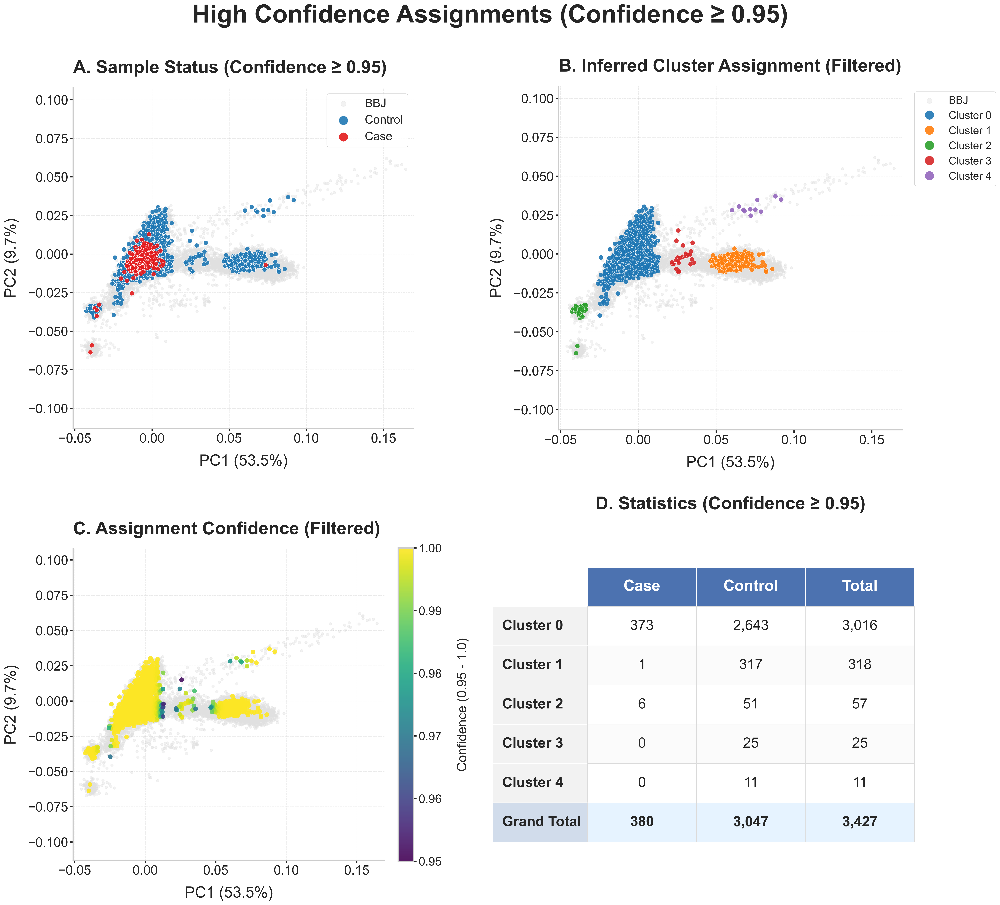


>>> SAVING HIGH CONFIDENCE RESULTS...
   -> Saving to: /Users/tie_zhao/Desktop/tuning.pca/results/02.high_confidence_samples
   [1/2] Saved filtered assignments: high_confidence_assignments_threshold_0.95.tsv
         - Total samples: 3427
         - Cases: 380
         - Controls: 3047
   [2/2] Saved summary statistics: high_confidence_summary_threshold_0.95.txt
>>> HIGH CONFIDENCE RESULTS SAVED SUCCESSFULLY.


In [15]:
# === High Confidence Sample Analysis (Threshold >= 0.95) - Publication Quality ===
# Filter the validation results and re-plot the 2x2 composite visualizations for high-confidence assignments only.

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
import os

# 1. Define Threshold & Filter
confidence_threshold = 0.95
print(f">>> FILTERING SAMPLES WITH CONFIDENCE >= {confidence_threshold}...")

if 'df_validation_results' in locals():
    # Filter Data
    df_filtered = df_validation_results[df_validation_results['Assignment_Confidence'] >= confidence_threshold].copy()
    
    n_original = len(df_validation_results)
    n_filtered = len(df_filtered)
    pct_kept = (n_filtered / n_original) * 100
    
    print(f"   -> Original Count : {n_original}")
    print(f"   -> Filtered Count : {n_filtered} ({pct_kept:.1f}%)")
    
    # 2. Setup Visualization (Publication Quality from Cell 6)
    # Global Style Settings (Maximized Fonts)
    plt.style.use('seaborn-v0_8-whitegrid')
    sns.set_context("paper", font_scale=2.5) # Increased scale

    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
        'font.size': 22,
        'axes.titlesize': 30,
        'axes.labelsize': 26,
        'xtick.labelsize': 22,
        'ytick.labelsize': 22,
        'legend.title_fontsize': 24,
        'legend.fontsize': 22,
        'figure.titlesize': 40,
        'figure.dpi': 300,
        'axes.spines.top': False,
        'axes.spines.right': False,
        'axes.linewidth': 2.0,
        'xtick.major.width': 2.0,
        'ytick.major.width': 2.0,
    })

    # Prepare Background Data (BBJ) - Use the same variables as the previous cell
    bbj_pc1_filtered = final_sscore.loc[final_sscore['SampleType'] == 'BBJ', pc_cols[0]]
    bbj_pc2_filtered = final_sscore.loc[final_sscore['SampleType'] == 'BBJ', pc_cols[1]]
    
    # Setup Figure (Same large canvas and layout as Cell 6)
    fig = plt.figure(figsize=(26, 24)) 
    gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1.2], wspace=0.3, hspace=0.3)

    # Re-Define Helper for Isometric View & Background (Adapted for Filtered Data)
    def setup_plot_base_filtered(ax, title):
        # 1. Background (BBJ) - Lowest Layer - Simplified Label "BBJ"
        ax.scatter(bbj_pc1_filtered, bbj_pc2_filtered, c='#E0E0E0', s=20, alpha=0.4, 
                   label='BBJ', rasterized=True, zorder=0)
        
        # 2. Isometric Limits 
        # Use full range from filtered data + background to keep context
        all_x = np.concatenate([bbj_pc1_filtered, df_filtered['PC1']])
        all_y = np.concatenate([bbj_pc2_filtered, df_filtered['PC2']])
        
        x_min, x_max = all_x.min(), all_x.max()
        y_min, y_max = all_y.min(), all_y.max()
        max_span = max(x_max - x_min, y_max - y_min) * 1.05
        x_center = (x_max + x_min) / 2
        y_center = (y_max + y_min) / 2
        
        ax.set_xlim(x_center - max_span/2, x_center + max_span/2)
        ax.set_ylim(y_center - max_span/2, y_center + max_span/2)
        ax.set_aspect('equal')
        
        ax.set_title(title, loc='left', pad=25, fontweight='bold')
        ax.set_xlabel(f"PC1 ({eigen_vals_pct[0]:.1%})", labelpad=15)
        ax.set_ylabel(f"PC2 ({eigen_vals_pct[1]:.1%})", labelpad=15)
        ax.grid(True, linestyle='--', alpha=0.3, color='#bbbbbb')

    # --- Plot A: Case vs Control (Filtered) ---
    ax1 = fig.add_subplot(gs[0, 0])
    setup_plot_base_filtered(ax1, "A. Sample Status (Confidence ≥ 0.95)")

    for stype, color, marker in [('Control', '#1F78B4', 'o'), ('Case', '#E31A1C', '^')]:
        subset = df_filtered[df_filtered['SampleType'] == stype]
        if not subset.empty:
            ax1.scatter(subset['PC1'], subset['PC2'], c=color, label=f"{stype}", 
                        s=60, alpha=0.9, edgecolors='white', linewidth=0.5, zorder=2 if stype=='Control' else 3)
    ax1.legend(loc='upper right', frameon=True, framealpha=0.9, fontsize=20, markerscale=2.0)

    # --- Plot B: Assigned Cluster (Filtered) ---
    ax2 = fig.add_subplot(gs[0, 1])
    setup_plot_base_filtered(ax2, "B. Inferred Cluster Assignment (Filtered)")

    if 'n_merged_clusters' in locals():
        palette_merged = sns.color_palette("tab10" if n_merged_clusters <= 10 else "tab20", n_colors=n_merged_clusters)
        sns.scatterplot(data=df_filtered, x='PC1', y='PC2', hue='Assigned_Merged_Cluster', 
                        palette=palette_merged, s=60, alpha=0.9, edgecolor='white', linewidth=0.3, ax=ax2, zorder=2)
    
        # Custom Legend
        h, l = ax2.get_legend_handles_labels()
        new_labels = []
        for txt in l:
            if "BBJ" in txt:
                new_labels.append("BBJ")
            else:
                new_labels.append(f"Cluster {txt}")
        # Position aligned with Cell 6
        ax2.legend(h, new_labels, title=None, bbox_to_anchor=(1.02, 1), loc='upper left', frameon=True, fontsize=18, markerscale=2.0)

    # --- Plot C: Assignment Confidence (Filtered) ---
    ax3 = fig.add_subplot(gs[1, 0])
    setup_plot_base_filtered(ax3, "C. Assignment Confidence (Filtered)")

    # Sort High -> Low for Low on top (though in filtered sample they are all high > 0.95, 
    # but still drawing order matters for slight variances)
    sort_idx = np.argsort(df_filtered['Assignment_Confidence'].values)[::-1]
    df_sorted = df_filtered.iloc[sort_idx]

    sc = ax3.scatter(df_sorted['PC1'], df_sorted['PC2'], 
                     c=df_sorted['Assignment_Confidence'], cmap='viridis', 
                     s=60, alpha=0.9, edgecolors='none', zorder=2, vmin=0.95, vmax=1.0)
    
    cbar = plt.colorbar(sc, ax=ax3, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=20)
    cbar.set_label('Confidence (0.95 - 1.0)', labelpad=25, size=22)

    # --- Plot D: Assignment Statistics Table (Filtered) ---
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.axis('off')
    ax4.set_title(f"D. Statistics (Confidence ≥ {confidence_threshold})", loc='center', pad=40, fontweight='bold')

    # 1. Prepare Data
    summary_table = df_filtered.groupby(['Assigned_Merged_Cluster', 'SampleType']).size().unstack(fill_value=0)
    for col in ['Case', 'Control']:
        if col not in summary_table.columns:
            summary_table[col] = 0
    summary_table = summary_table[['Case', 'Control']]
    summary_table['Total'] = summary_table['Case'] + summary_table['Control']
    
    # 2. Build Text Content
    columns = ['Case', 'Control', 'Total']
    row_labels = [f"Cluster {idx}" for idx in summary_table.index]
    cell_text = []

    for idx, row in summary_table.iterrows():
        cell_text.append([
            f"{int(row['Case']):,}", 
            f"{int(row['Control']):,}", 
            f"{int(row['Total']):,}"
        ])

    # Grand Total Row
    totals = summary_table[['Case', 'Control', 'Total']].sum()
    cell_text.append([f"{int(totals['Case']):,}", f"{int(totals['Control']):,}", f"{int(totals['Total']):,}"])
    row_labels.append("Grand Total")

    # 3. Create Table
    if len(cell_text) > 0:
        the_table = ax4.table(
            cellText=cell_text,
            rowLabels=row_labels,
            colLabels=columns,
            loc='center',
            cellLoc='center',
            bbox=[0.15, 0.1, 0.8, 0.8] # Shifted Right (0.15), Large Bbox
        )

        # 4. Styling (Maximized Fonts)
        the_table.auto_set_font_size(False)
        the_table.set_fontsize(24)

        cells = the_table.get_celld()
        n_rows_table = len(cell_text) + 1 # +1 for header
        row_height = 0.9 / n_rows_table # Dynamic height

        for (row, col), cell in cells.items():
            cell.set_height(row_height)
            if row == 0:
                cell.set_text_props(weight='bold', color='white', size=26)
                cell.set_facecolor('#4C72B0')
                cell.set_linewidth(1.5)
                cell.set_edgecolor('white')
            elif col == -1:
                cell.set_text_props(weight='bold', size=24)
                cell.set_facecolor('#f2f2f2')
                cell.set_linewidth(1)
                cell.set_edgecolor('white')
                if row == len(cell_text): # Grand Total
                    cell.set_facecolor('#d1dceb') 
            else:
                cell.set_text_props(size=24)
                cell.set_linewidth(0.5)
                cell.set_edgecolor('#dddddd')
                if row == len(cell_text):
                    cell.set_facecolor('#e6f3ff')
                    cell.set_text_props(weight='bold')
                elif row % 2 == 0:
                    cell.set_facecolor('#fbfbfb')
                else:
                    cell.set_facecolor('white')
    else:
        ax4.text(0.5, 0.5, "No samples passed threshold", ha='center', fontsize=24)

    # Main Title
    plt.suptitle(f"High Confidence Assignments (Confidence ≥ {confidence_threshold})", 
                 fontsize=42, fontweight='bold', y=0.96)

    import os
    plt.savefig(os.path.join(fig_dir, '05.high_confidence_samples_analysis.png'), bbox_inches='tight', dpi=300)

    plt.show()
    
    # --- 8. Save Filtered Results ---
    print("\n>>> SAVING HIGH CONFIDENCE RESULTS...")
    
    # Define output directory: results/02.high_confidence_samples
    folder_name_filtered = "02.high_confidence_samples"
    output_dir_filtered = os.path.join(output_base, folder_name_filtered)
    os.makedirs(output_dir_filtered, exist_ok=True)
    print(f"   -> Saving to: {output_dir_filtered}")
    
    # 1. Save filtered sample assignments (main result file)
    output_file_filtered = f"high_confidence_assignments_threshold_{confidence_threshold}.tsv"
    output_path_filtered = os.path.join(output_dir_filtered, output_file_filtered)
    
    # Select relevant columns to save
    cols_to_save = ['FID', 'IID', 'SampleType', 'Assigned_Merged_Cluster', 'Assignment_Confidence', 'PC1', 'PC2']
    # Add probability columns
    prob_cols = [col for col in df_filtered.columns if col.startswith('Prob_Merge_Cluster_')]
    cols_to_save.extend(prob_cols)
    
    df_filtered[cols_to_save].to_csv(output_path_filtered, sep='\t', index=False)
    print(f"   [1/2] Saved filtered assignments: {output_file_filtered}")
    print(f"         - Total samples: {len(df_filtered)}")
    print(f"         - Cases: {(df_filtered['SampleType'] == 'Case').sum()}")
    print(f"         - Controls: {(df_filtered['SampleType'] == 'Control').sum()}")
    
    # 2. Save summary statistics
    summary_file = f"high_confidence_summary_threshold_{confidence_threshold}.txt"
    summary_path = os.path.join(output_dir_filtered, summary_file)
    
    with open(summary_path, 'w') as f:
        f.write("="*60 + "\n")
        f.write(f"HIGH CONFIDENCE SAMPLE FILTERING RESULTS\n")
        f.write(f"Confidence Threshold: >= {confidence_threshold}\n")
        f.write("="*60 + "\n\n")
        
        f.write(f"OVERALL STATISTICS:\n")
        f.write(f"  - Original Sample Count  : {n_original:,}\n")
        f.write(f"  - Filtered Sample Count  : {n_filtered:,}\n")
        f.write(f"  - Retention Rate         : {pct_kept:.2f}%\n")
        f.write(f"  - Samples Excluded       : {n_original - n_filtered:,}\n\n")
        
        f.write(f"SAMPLE TYPE BREAKDOWN:\n")
        for stype in ['Case', 'Control']:
            count = (df_filtered['SampleType'] == stype).sum()
            original_count = (df_validation_results['SampleType'] == stype).sum()
            retention = (count / original_count * 100) if original_count > 0 else 0
            f.write(f"  - {stype:8s}: {count:5,} / {original_count:5,} ({retention:.2f}% retained)\n")
        
        f.write(f"\nCLUSTER ASSIGNMENT DISTRIBUTION:\n")
        cluster_dist = df_filtered.groupby(['Assigned_Merged_Cluster', 'SampleType']).size().unstack(fill_value=0)
        for idx in cluster_dist.index:
            case_count = cluster_dist.loc[idx, 'Case'] if 'Case' in cluster_dist.columns else 0
            ctrl_count = cluster_dist.loc[idx, 'Control'] if 'Control' in cluster_dist.columns else 0
            total = case_count + ctrl_count
            f.write(f"  - Cluster {idx}: {total:5,} samples (Case: {case_count:4,}, Control: {ctrl_count:4,})\n")
        
        f.write(f"\nCONFIDENCE SCORE STATISTICS (Filtered Samples):\n")
        conf_stats = df_filtered['Assignment_Confidence'].describe()
        f.write(f"  - Mean       : {conf_stats['mean']:.4f}\n")
        f.write(f"  - Std Dev    : {conf_stats['std']:.4f}\n")
        f.write(f"  - Min        : {conf_stats['min']:.4f}\n")
        f.write(f"  - 25%        : {conf_stats['25%']:.4f}\n")
        f.write(f"  - Median     : {conf_stats['50%']:.4f}\n")
        f.write(f"  - 75%        : {conf_stats['75%']:.4f}\n")
        f.write(f"  - Max        : {conf_stats['max']:.4f}\n")
        
        f.write("\n" + "="*60 + "\n")
    
    print(f"   [2/2] Saved summary statistics: {summary_file}")
    print(">>> HIGH CONFIDENCE RESULTS SAVED SUCCESSFULLY.")

else:
    print("Error: 'df_validation_results' is not defined. Please run the previous analysis cell first.")

>>> ANALYZING PC DISTRIBUTIONS FOR HIGH CONFIDENCE SAMPLES (>= 0.95)...
   -> Cluster 0 samples: 3016 / 3427
   -> Case samples (Cluster 0): 373
   -> Control samples (Cluster 0): 2643


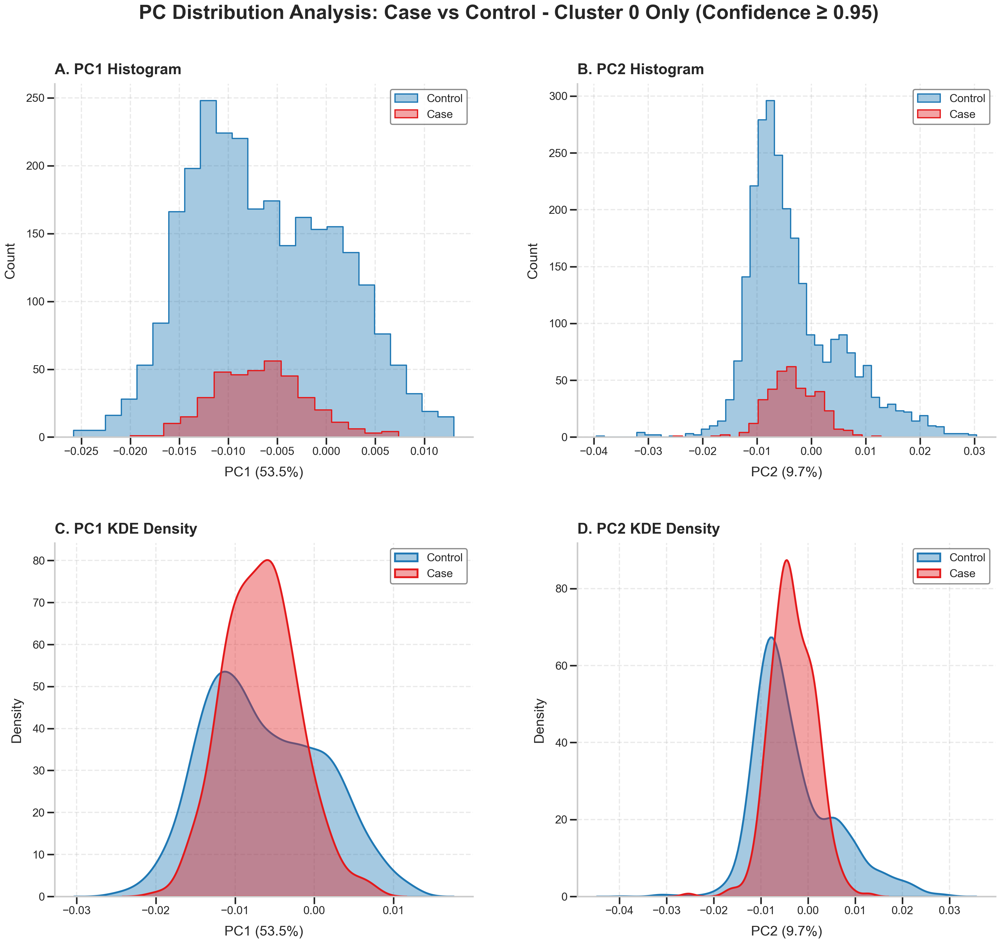


                 PC DISTRIBUTION STATISTICS                 

PC1 Statistics:
  Control (n=2643):
    Mean:  -0.0064  |  Std:   0.0074
    Min:   -0.0258  |  Max:   0.0130
  Case (n=373):
    Mean:  -0.0067  |  Std:   0.0046
    Min:   -0.0200  |  Max:   0.0074
  Difference (Case - Control):  -0.0003

PC2 Statistics:
  Control (n=2643):
    Mean:  -0.0031  |  Std:   0.0086
    Min:   -0.0395  |  Max:   0.0304
  Case (n=373):
    Mean:  -0.0033  |  Std:   0.0046
    Min:   -0.0254  |  Max:   0.0129
  Difference (Case - Control):  -0.0002

>>> STATISTICAL TESTING (Case vs Control - Cluster 0)

--- PC1 Analysis ---
  Welch's t-test (Mean):      t=-1.2397, p=2.1554e-01
  Mann-Whitney U (Rank Sum):  p=8.6196e-01
  Kolmogorov-Smirnov (Dist):  D=0.1616, p=6.3720e-08
  Result: Not Significant (at alpha=0.05)

--- PC2 Analysis ---
  Welch's t-test (Mean):      t=-0.6983, p=4.8521e-01
  Mann-Whitney U (Rank Sum):  p=2.6462e-04
  Kolmogorov-Smirnov (Dist):  D=0.2079, p=7.2890e-13
  Result: ** SI

In [16]:
# === KDE Distribution Analysis: Case vs Control (High Confidence Samples) ===
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print(f">>> ANALYZING PC DISTRIBUTIONS FOR HIGH CONFIDENCE SAMPLES (>= {confidence_threshold})...")

if 'df_filtered' in locals():
    # Apply Consistent Publication Style
    plt.style.use('seaborn-v0_8-whitegrid') 
    sns.set_context("poster", font_scale=1.1)

    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
        'font.size': 20,          
        'axes.titlesize': 24,     
        'axes.labelsize': 22,    
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'legend.title_fontsize': 20,
        'legend.fontsize': 18,
        'figure.titlesize': 28,
        'figure.dpi': 150, 
        'axes.spines.top': False, 
        'axes.spines.right': False
    })
    
    # Filter for Cluster 0 only
    df_cluster0 = df_filtered[df_filtered['Assigned_Merged_Cluster'] == 0].copy()
    print(f"   -> Cluster 0 samples: {len(df_cluster0)} / {len(df_filtered)}")
    
    # Separate Case and Control samples from Cluster 0
    df_case = df_cluster0[df_cluster0['SampleType'] == 'Case']
    df_ctrl = df_cluster0[df_cluster0['SampleType'] == 'Control']
    
    print(f"   -> Case samples (Cluster 0): {len(df_case)}")
    print(f"   -> Control samples (Cluster 0): {len(df_ctrl)}")
    
    # Create 2x2 subplot layout (Updated for Hist + KDE)
    fig, axes = plt.subplots(2, 2, figsize=(24, 22))
    plt.subplots_adjust(wspace=0.25, hspace=0.3, left=0.08, right=0.95, top=0.90, bottom=0.08)
    
    # Color scheme
    color_case = '#E31A1C'
    color_ctrl = '#1F78B4'
    
    # --- Statistical Tests (Calculated before plotting for annotation) ---
    from scipy import stats
    
    p_vals = {}
    for pc_col in ['PC1', 'PC2']:
        data_case = df_case[pc_col].dropna()
        data_ctrl = df_ctrl[pc_col].dropna()
        
        # Kolmogorov-Smirnov Test
        ks_stat, p_val_ks = stats.ks_2samp(data_case, data_ctrl)
        p_vals[pc_col] = p_val_ks

    # --- Plot A: PC1 Histogram (Top Left) ---
    ax1 = axes[0, 0]
    sns.histplot(data=df_ctrl, x='PC1', color=color_ctrl, alpha=0.4, label='Control', ax=ax1, stat='count', element="step")
    sns.histplot(data=df_case, x='PC1', color=color_case, alpha=0.4, label='Case', ax=ax1, stat='count', element="step")
    
    ax1.set_title(f'A. PC1 Histogram', loc='left', pad=15, fontweight='bold')
    ax1.set_xlabel(f'PC1 ({eigen_vals_pct[0]:.1%})', labelpad=15)
    ax1.set_ylabel('Count', labelpad=15)
    ax1.legend(loc='best', frameon=True, framealpha=0.9, edgecolor='gray')
    ax1.grid(True, linestyle='--', alpha=0.3, color='#bbbbbb')

    # --- Plot B: PC2 Histogram (Top Right) ---
    ax2 = axes[0, 1]
    sns.histplot(data=df_ctrl, x='PC2', color=color_ctrl, alpha=0.4, label='Control', ax=ax2, stat='count', element="step")
    sns.histplot(data=df_case, x='PC2', color=color_case, alpha=0.4, label='Case', ax=ax2, stat='count', element="step")
    
    ax2.set_title(f'B. PC2 Histogram', loc='left', pad=15, fontweight='bold')
    ax2.set_xlabel(f'PC2 ({eigen_vals_pct[1]:.1%})', labelpad=15)
    ax2.set_ylabel('Count', labelpad=15)
    ax2.legend(loc='best', frameon=True, framealpha=0.9, edgecolor='gray')
    ax2.grid(True, linestyle='--', alpha=0.3, color='#bbbbbb')

    # --- Plot C: PC1 KDE (Bottom Left) ---
    ax3 = axes[1, 0]
    sns.kdeplot(data=df_ctrl, x='PC1', color=color_ctrl, fill=True, alpha=0.4, 
                linewidth=3, label='Control', ax=ax3)
    sns.kdeplot(data=df_case, x='PC1', color=color_case, fill=True, alpha=0.4, 
                linewidth=3, label='Case', ax=ax3)
    
    ax3.set_title(f'C. PC1 KDE Density', loc='left', pad=15, fontweight='bold')
    ax3.set_xlabel(f'PC1 ({eigen_vals_pct[0]:.1%})', labelpad=15)
    ax3.set_ylabel('Density', labelpad=15)
    ax3.legend(loc='best', frameon=True, framealpha=0.9, edgecolor='gray')
    ax3.grid(True, linestyle='--', alpha=0.3, color='#bbbbbb')
    
    # --- Plot D: PC2 KDE (Bottom Right) ---
    ax4 = axes[1, 1]
    sns.kdeplot(data=df_ctrl, x='PC2', color=color_ctrl, fill=True, alpha=0.4, 
                linewidth=3, label='Control', ax=ax4)
    sns.kdeplot(data=df_case, x='PC2', color=color_case, fill=True, alpha=0.4, 
                linewidth=3, label='Case', ax=ax4)
    
    ax4.set_title(f'D. PC2 KDE Density', loc='left', pad=15, fontweight='bold')
    ax4.set_xlabel(f'PC2 ({eigen_vals_pct[1]:.1%})', labelpad=15)
    ax4.set_ylabel('Density', labelpad=15)
    ax4.legend(loc='best', frameon=True, framealpha=0.9, edgecolor='gray')
    ax4.grid(True, linestyle='--', alpha=0.3, color='#bbbbbb')
    
    # Main Title
    plt.suptitle(f'PC Distribution Analysis: Case vs Control - Cluster 0 Only (Confidence ≥ {confidence_threshold})', 
                 fontsize=32, fontweight='bold', y=0.98)
    
    import os
    plt.savefig(os.path.join(fig_dir, '06.cluster0_case_control_kde.png'), bbox_inches='tight')
    
    plt.show()
    
    # Print Summary Statistics
    print("\n" + "="*60)
    print(f"{'PC DISTRIBUTION STATISTICS':^60}")
    print("="*60)
    
    for pc_name, pc_col in [('PC1', 'PC1'), ('PC2', 'PC2')]:
        print(f"\n{pc_name} Statistics:")
        print(f"  Control (n={len(df_ctrl)}):")
        ctrl_stats = df_ctrl[pc_col].describe()
        print(f"    Mean: {ctrl_stats['mean']:8.4f}  |  Std: {ctrl_stats['std']:8.4f}")
        print(f"    Min:  {ctrl_stats['min']:8.4f}  |  Max: {ctrl_stats['max']:8.4f}")
        
        print(f"  Case (n={len(df_case)}):")
        case_stats = df_case[pc_col].describe()
        print(f"    Mean: {case_stats['mean']:8.4f}  |  Std: {case_stats['std']:8.4f}")
        print(f"    Min:  {case_stats['min']:8.4f}  |  Max: {case_stats['max']:8.4f}")
        
        # Calculate difference
        mean_diff = case_stats['mean'] - ctrl_stats['mean']
        print(f"  Difference (Case - Control): {mean_diff:8.4f}")
    
    print("="*60)

    # --- Statistical Tests ---
    print(f"\n>>> STATISTICAL TESTING (Case vs Control - Cluster 0)")
    from scipy import stats

    for pc_col in ['PC1', 'PC2']:
        print(f"\n--- {pc_col} Analysis ---")
        data_case = df_case[pc_col].dropna()
        data_ctrl = df_ctrl[pc_col].dropna()

        # 1. Welch's t-test (Means)
        t_stat, p_val_t = stats.ttest_ind(data_case, data_ctrl, equal_var=False)
        print(f"  Welch's t-test (Mean):      t={t_stat:.4f}, p={p_val_t:.4e}")

        # 2. Mann-Whitney U Test (Median/Rank)
        u_stat, p_val_u = stats.mannwhitneyu(data_case, data_ctrl)
        print(f"  Mann-Whitney U (Rank Sum):  p={p_val_u:.4e}")
        
        # 3. Kolmogorov-Smirnov Test (Distribution Shape)
        ks_stat, p_val_ks = stats.ks_2samp(data_case, data_ctrl)
        print(f"  Kolmogorov-Smirnov (Dist):  D={ks_stat:.4f}, p={p_val_ks:.4e}")

        # Interpretation
        is_sig = p_val_u < 0.05
        sig_str = "** SIGNIFICANT **" if is_sig else "Not Significant"
        print(f"  Result: {sig_str} (at alpha=0.05)")

    print("="*60)
    
else:
    print("Error: 'df_filtered' not found. Please run the high confidence filtering cell first.")